
### Jupyter Notebook
##  **Scene creation and functionality analysis**

<br>
<br>
by
<b>Gabriel Mesquida Masana</b><br>
<a href=mailto:gabmm@stanford.edu>gabmm@stanford.edu</a>
<br>

In [1]:
from scene import Scene
from flight import Flight as Fl

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [1]:
# More output formatting
matplotlib.style.use("seaborn-v0_8-pastel")
pd.options.display.float_format = "{:,.2f}".format
sns.set_style("whitegrid")

# Note this configuration for retina screens only
%config InlineBackend.figure_format = 'retina'

# Only if you're editing the extensions
%load_ext autoreload
%autoreload 2

### Default file

In [2]:
# Full data May 24
file_name = "24-05_full_exp.pkl"

### Generating full scene

In [3]:
scene1 = Scene(from_file=file_name)
scene1

Loaded 49884 flights


Scene with 49884 flights, loaded from 24-05_full_exp.pkl.

### Generating arrivals from TOD

In [37]:
scene2 = Scene(from_scene=scene1).arrivals("WMKK")
scene2

Scene with 1128 flights, copy of object (loaded from 24-05_full_exp.pkl), arriving to WSSS from WMKK.

In [38]:
scene3 = Scene(from_scene=scene2).descent()
scene3

Scene with 1128 flights, copy of object (copy of object (loaded from 24-05_full_exp.pkl), arriving to WSSS from WMKK), descent only.

In [39]:
scene4 = Scene(from_scene=scene3).higher_than(1500)
scene4

Scene with 1128 flights, copy of object (copy of object (copy of object (loaded from 24-05_full_exp.pkl), arriving to WSSS from WMKK), descent only), higher than 1500.

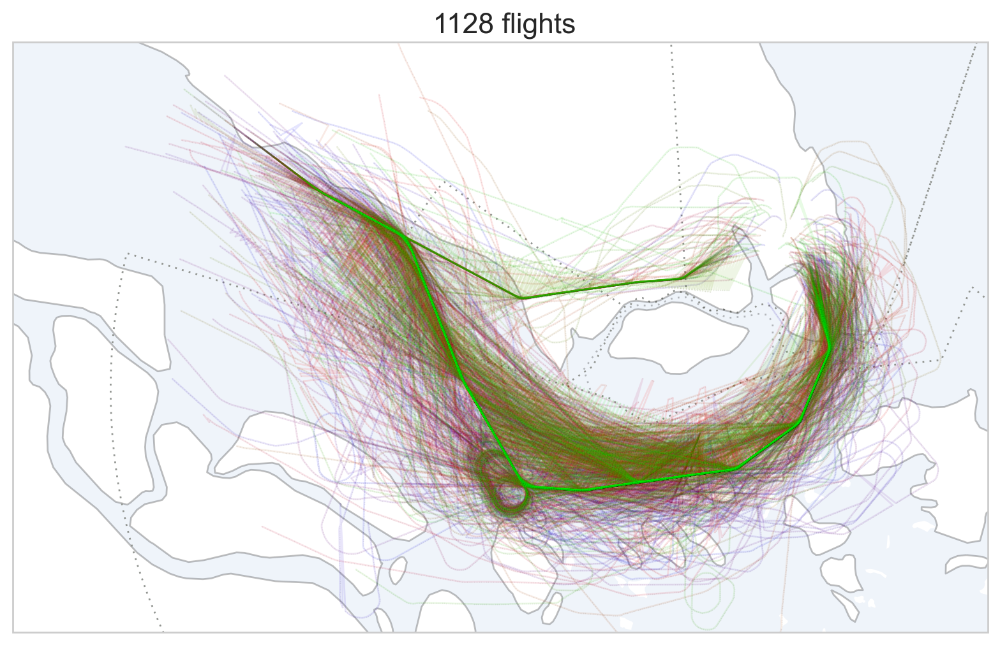

In [40]:
scene4.plot()

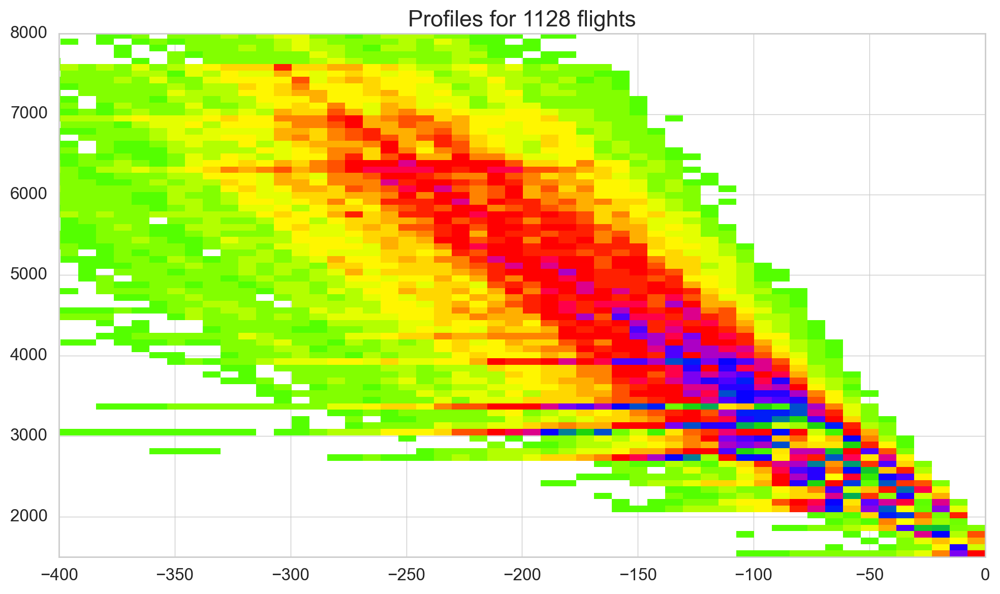

In [41]:
scene4.plot_elevation_histogram(
    endalign=True,
    xlim=400,
    ylim=8000,
    alpha_threshold=10,
)

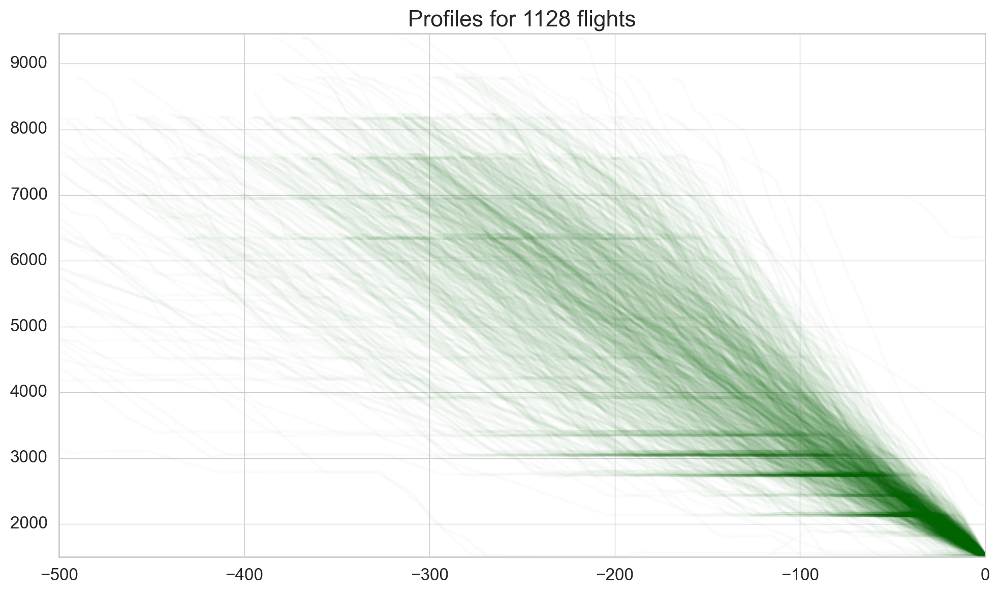

In [42]:
scene4.plot_elevation_profile(
    endalign=True,
    alpha=0.02,
    xlim=500,
    ylim=(1500, scene4.alt_max()),
)

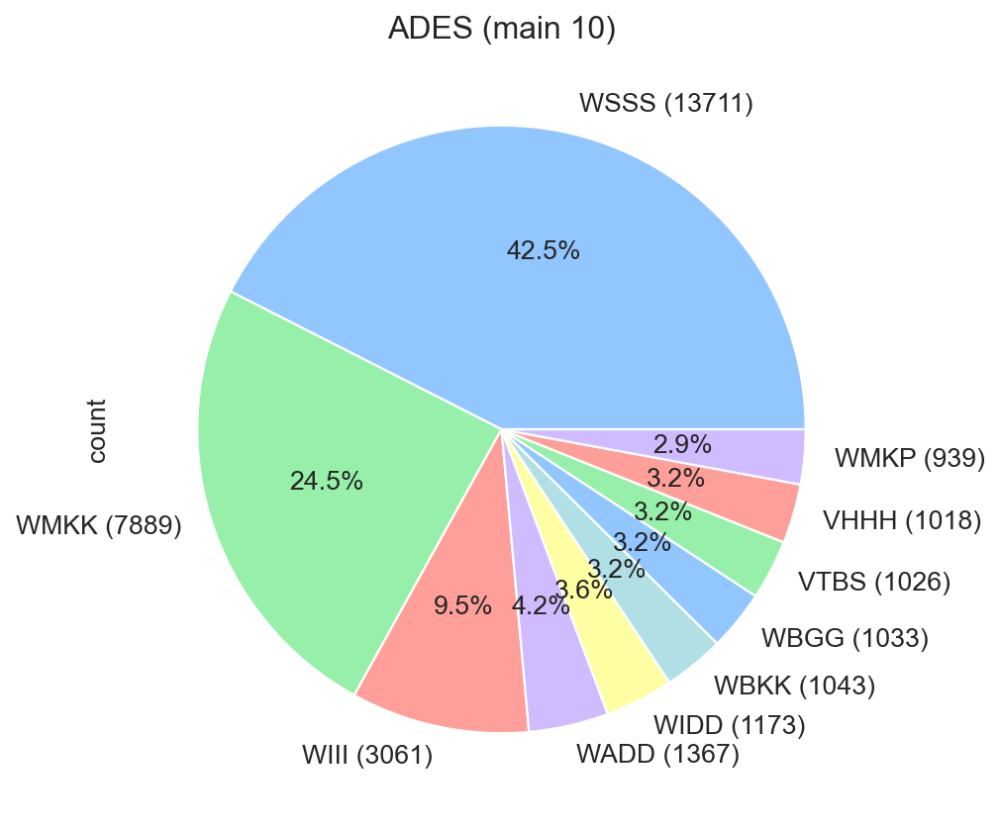

In [63]:
scene1.query_attribute(attribute="ADES", pie=True)

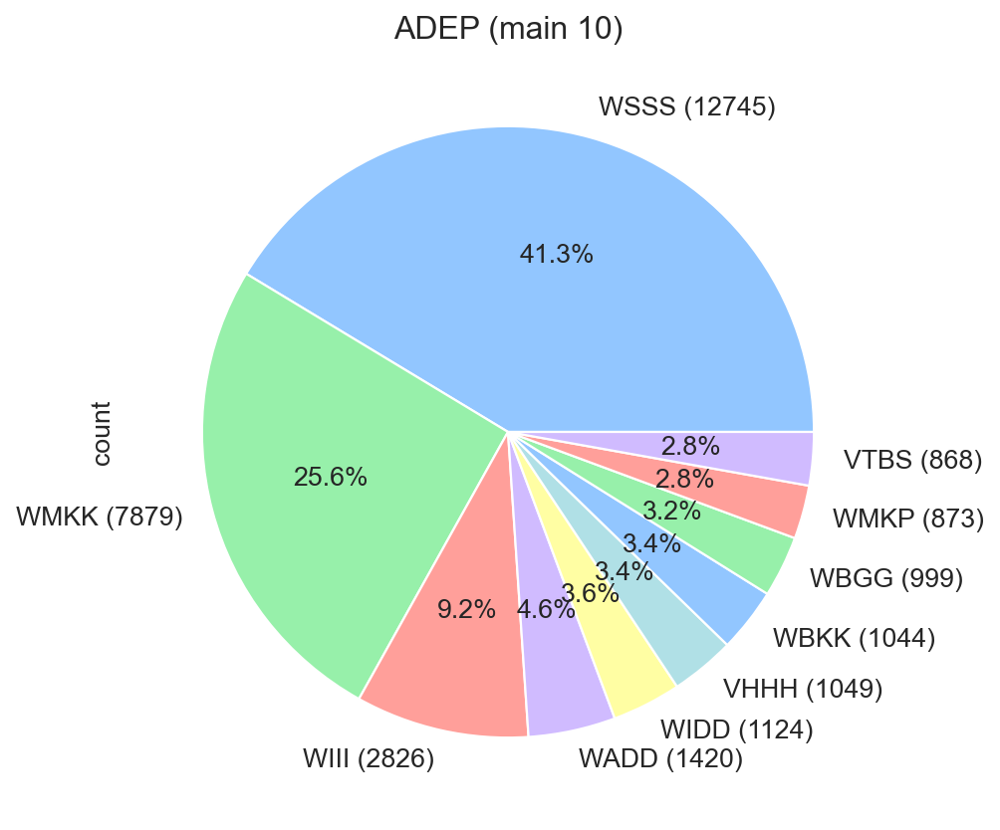

In [64]:
scene1.query_attribute(attribute="ADEP", pie=True)

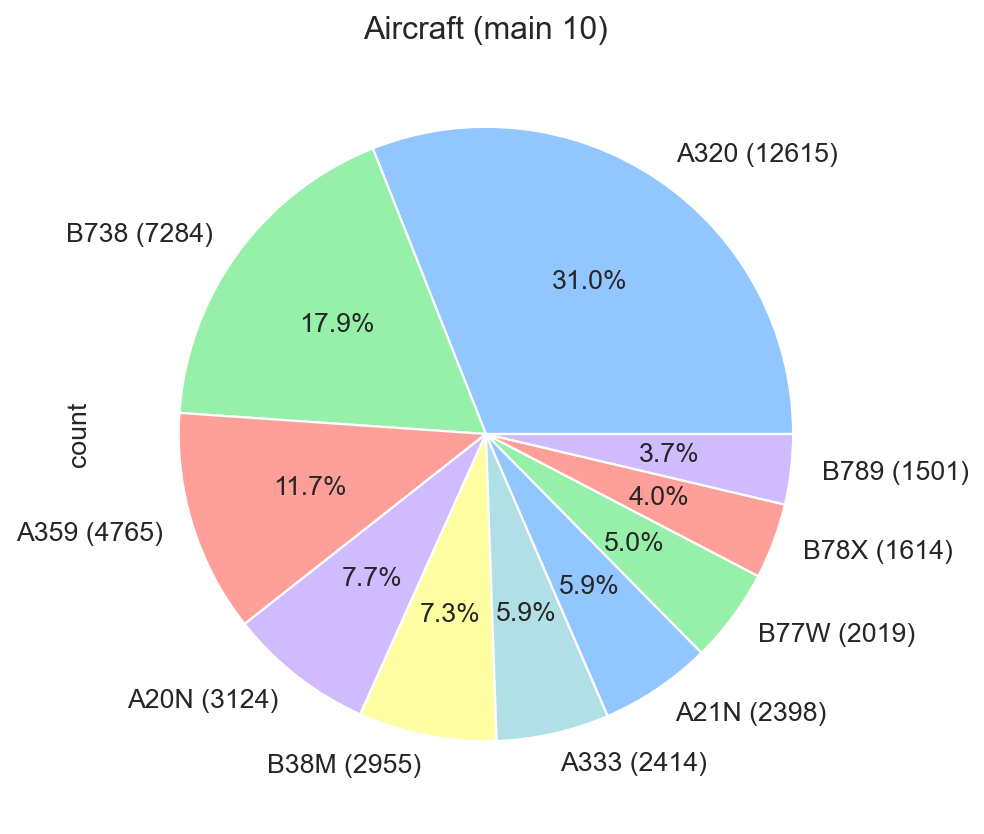

In [66]:
scene1.query_attribute(attribute="Aircraft", pie=True)

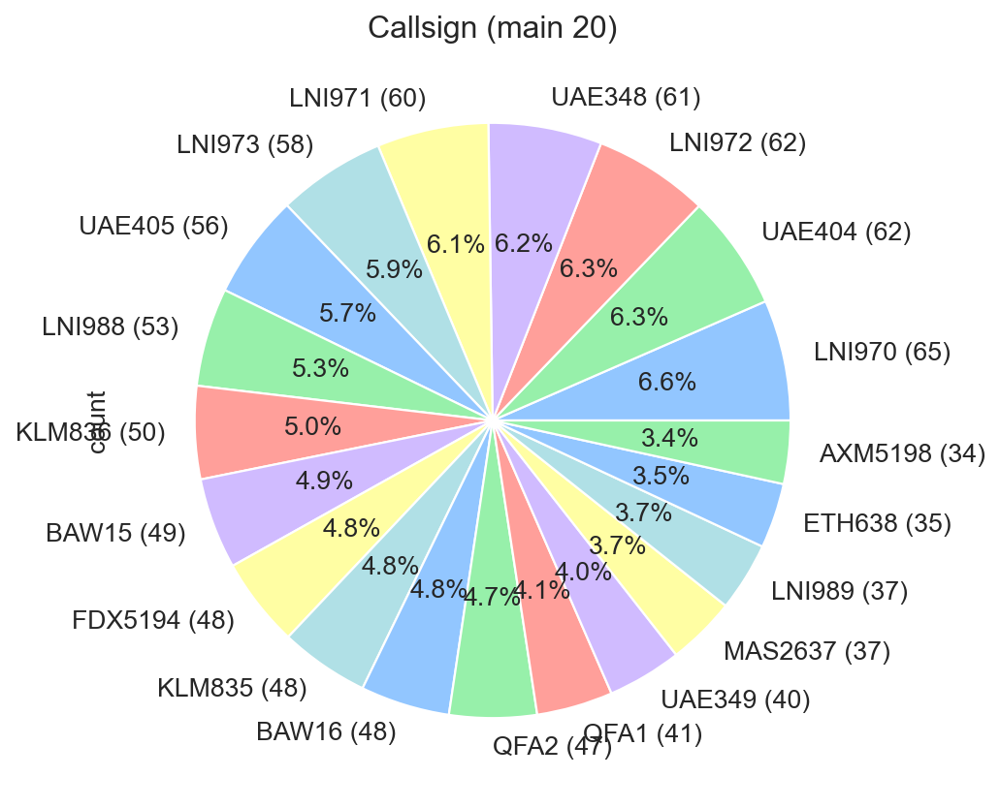

In [67]:
scene1.query_attribute(attribute="Callsign", pie=True, n=20)

In [54]:
scene2.flights[1].additional

{'alt_max': 7559.039758110728,
 'c_max': 0.04049476510452367,
 'c_mean': 0.006173740022998817}

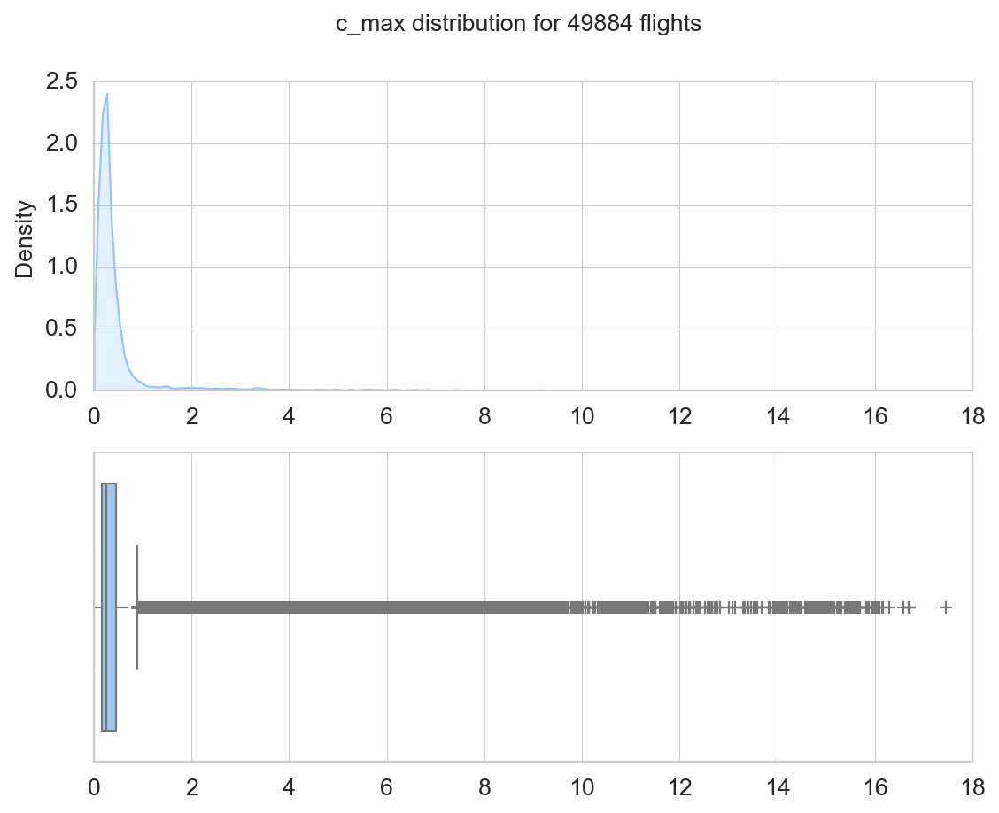

In [56]:
scene1.plot_c()

In [57]:
scene_low, scene_high = scene1.split_c(c_threshold=2)
scene_low, scene_high

(Scene with 45732 flights, loaded from 24-05_full_exp.pkl, c<=2.,
 Scene with 4152 flights, loaded from 24-05_full_exp.pkl, c>2.)

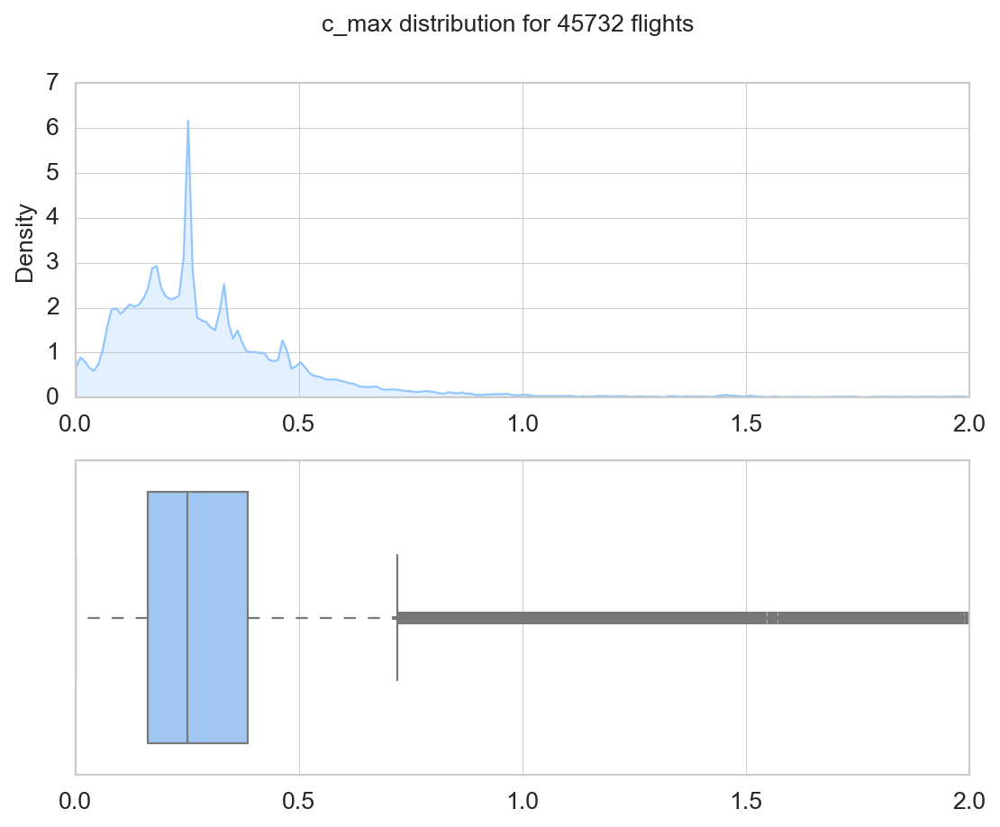

In [58]:
scene_low.plot_c()

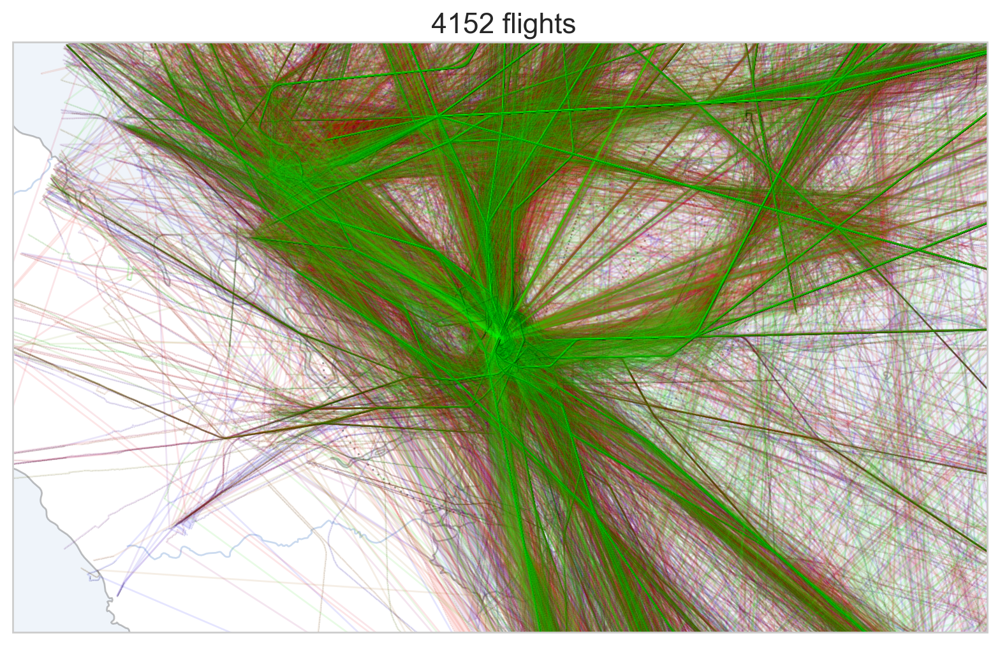

In [59]:
scene_high.plot(wide=500, move_east=0, move_north=0)

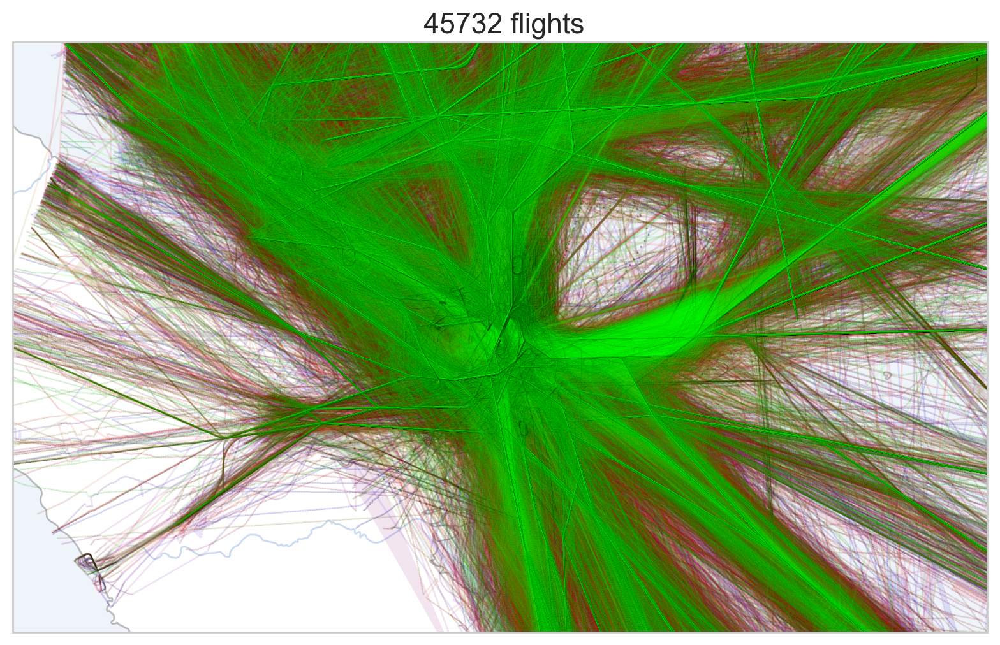

In [60]:
scene_low.plot(wide=500, move_east=0, move_north=0)